<a href="https://colab.research.google.com/github/SarahMarquardt73/MLProject/blob/main/AML_Project_LearnerNotebook_FullCode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [ ]:
from google.colab import drive, files
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 4.1 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
mizani 0.13.1 requires pandas>=2.2.0, but you have pandas 1.5

In [ ]:
!pip install scikit-learn xgboost

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user
# !pip install --upgrade -q threadpoolctl

In [ ]:
# help read and manipulate data
import pandas as pd
import numpy as np

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# missing value imputation
from sklearn.impute import SimpleImputer

# model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# metric scores and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
# data scaling and ne hot encoding
from sklearn.preprocessing import StandardScaler, OneHotEncoder, minmax_scale

# tuning model
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

# smote
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import classification_report

# feature selection
from sklearn.feature_selection import RFE

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

import xgboost as xgb

from sklearn.tree import DecisionTreeClassifier

# To supress warnings
import warnings
warnings.filterwarnings('ignore')
#

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

## Loading the dataset

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/PROJECT 3/BankChurners.csv')

In [ ]:
df = data.copy()

## Data Overview

- Observations
- Sanity checks

In [ ]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
df.shape

(10127, 21)

10127 records with 21 columns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category, Card_Category are all objects. I will have to find a way to encode these variables into integers            

In [ ]:
df.drop(columns=['CLIENTNUM'], inplace=True)

In [ ]:
df.isnull().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [ ]:
# Checking for the null value in the dataset
df.isna().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


Seems that education level, and Marital Status have some null records. However, that doesn't mean that other columns don't have variables that indicate null. For example, after further inspection of salary, some records indicate abc which could be perceived as null.

In [ ]:
{column: list(data[column].unique()) for column in data.select_dtypes('object').columns}

{'Attrition_Flag': ['Existing Customer', 'Attrited Customer'],
 'Gender': ['M', 'F'],
 'Education_Level': ['High School',
  'Graduate',
  'Uneducated',
  nan,
  'College',
  'Post-Graduate',
  'Doctorate'],
 'Marital_Status': ['Married', 'Single', nan, 'Divorced'],
 'Income_Category': ['$60K - $80K',
  'Less than $40K',
  '$80K - $120K',
  '$40K - $60K',
  '$120K +',
  'abc'],
 'Card_Category': ['Blue', 'Gold', 'Silver', 'Platinum']}

Fill nan with unknown

In [ ]:
# Set any nan value to "Unknown"
df['Education_Level'] = df['Education_Level'].fillna('Unknown')
df['Marital_Status'] = df['Marital_Status'].fillna('Unknown')

# replace all records of 'abc' with nan
df['Income_Category'] = df['Income_Category'].replace('abc', 'Unknown')

In [ ]:
df['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'Unknown', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [ ]:
df['Marital_Status'].unique()

array(['Married', 'Single', 'Unknown', 'Divorced'], dtype=object)

In [ ]:
df['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'Unknown'], dtype=object)

In [ ]:
df['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'Unknown', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

## Column Change
Change Object data type to int

I need to decide whether there should be order for the column or if I should one hot encode. Here are the data types that are object:

Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category, Card_Category.

The only columns that have some type of order is Income_Category and Education.

Income Category is an ordered data type because it describes if a person makes a "range." ($60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'abc').

Since Income_Category is a range, I will make 1 = Less than $40K, 2 = $60K - $80K, etc.

I first need to mark 'abc' as null.

Education is ordinal because there is an order to education. Uneducated, Highschool, College student, College graduated, Post-Graduate, Doctorate, and Unknown

I will begin mapping these two columns

In [ ]:
{column: list(df[column].unique()) for column in df.select_dtypes('object').columns}

{'Attrition_Flag': ['Existing Customer', 'Attrited Customer'],
 'Gender': ['M', 'F'],
 'Education_Level': ['High School',
  'Graduate',
  'Uneducated',
  'Unknown',
  'College',
  'Post-Graduate',
  'Doctorate'],
 'Marital_Status': ['Married', 'Single', 'Unknown', 'Divorced'],
 'Income_Category': ['$60K - $80K',
  'Less than $40K',
  '$80K - $120K',
  '$40K - $60K',
  '$120K +',
  'Unknown'],
 'Card_Category': ['Blue', 'Gold', 'Silver', 'Platinum']}

In [ ]:
# iterate through the income category and make a dictionairy
numbers = [0,1,2,3,4,5,6]
income_category = ['Unknown','Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +' ]

income_dict = dict(zip(income_category, numbers))
income_dict

{'Unknown': 0,
 'Less than $40K': 1,
 '$40K - $60K': 2,
 '$60K - $80K': 3,
 '$80K - $120K': 4,
 '$120K +': 5}

In [ ]:
# map the income_dict to the Income_Category column.
df['Income_Category'] = df['Income_Category'].map(income_dict)

In [ ]:
df['Income_Category'].unique()

array([3, 1, 4, 2, 5, 0])

In [ ]:
# Step 1: Replace NaN with 'Unknown' (or '0')
df['Education_Level'] = df['Education_Level'].apply(lambda x: 'Unknown' if pd.isna(x) else x)

# Step 2: Create the dictionary for mapping (order from 0 to Doctorate)
education_order = ['Unknown', 'Uneducated', 'High School', 'College', 'Post-Graduate', 'Doctorate', 'Graduate']
numbers = [0, 1, 2, 3, 4, 5, 6]  # corresponding numeric values for the education levels

education_dict = dict(zip(education_order, numbers))

# Step 3: Map the Education_Level column to the dictionary
df['Education_Level_Mapped'] = df['Education_Level'].map(education_dict)
df['Education_Level'] = df['Education_Level_Mapped']

df['Education_Level'].unique()

array([2, 6, 1, 0, 3, 4, 5])

Now that education has an ordering system and blank values are now nan I can now move forward to one hot encoding the rest of the object columns

In [ ]:
{column: list(df[column].unique()) for column in df.select_dtypes('object').columns}

{'Attrition_Flag': ['Existing Customer', 'Attrited Customer'],
 'Gender': ['M', 'F'],
 'Marital_Status': ['Married', 'Single', 'Unknown', 'Divorced'],
 'Card_Category': ['Blue', 'Gold', 'Silver', 'Platinum']}

Now I must encode Attrition_Flag, Gender, Marital_Status, and Card_Category since there is now order.

In [ ]:
# encode all object columns into dummies
df = pd.get_dummies(df, columns=['Attrition_Flag', 'Gender', 'Marital_Status', 'Card_Category'], drop_first=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Customer_Age                      10127 non-null  int64  
 1   Dependent_count                   10127 non-null  int64  
 2   Education_Level                   10127 non-null  int64  
 3   Income_Category                   10127 non-null  int64  
 4   Months_on_book                    10127 non-null  int64  
 5   Total_Relationship_Count          10127 non-null  int64  
 6   Months_Inactive_12_mon            10127 non-null  int64  
 7   Contacts_Count_12_mon             10127 non-null  int64  
 8   Credit_Limit                      10127 non-null  float64
 9   Total_Revolving_Bal               10127 non-null  int64  
 10  Avg_Open_To_Buy                   10127 non-null  float64
 11  Total_Amt_Chng_Q4_Q1              10127 non-null  float64
 12  Tota

Attrition_Flag_Existing Customer is a binary column indicating whether a customer is an "Existing Customer" (1) or an "Attrited Customer" (0).

In [ ]:
# change bool values to 0's and 1's
for column in df.columns:
    if df[column].dtype == 'bool':
        df[column] = df[column].astype(int)

In [ ]:
df.head()

,Customer_Age,Dependent_count,Education_Level,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_Mapped,Attrition_Flag_Existing Customer,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,45,3,2,3,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,2,1,1,1,0,0,0,0,0
1,49,5,6,1,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,6,1,0,0,1,0,0,0,0
2,51,3,6,4,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,6,1,1,1,0,0,0,0,0
3,40,4,2,1,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,2,1,0,0,0,1,0,0,0
4,40,3,1,3,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000,1,1,1,1,0,0,0,0,0


All columns are now either int, bool, or float. Lets look at the nulls again

In [ ]:
df.isnull().sum()

,0
Customer_Age,0
Dependent_count,0
Education_Level,0
Income_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0
Contacts_Count_12_mon,0
Credit_Limit,0
Total_Revolving_Bal,0


Everything looks good. There are no nulls.

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Education_Level,10127.000,3.124,2.265,0.000,1.000,3.000,6.000,6.000
Income_Category,10127.000,2.086,1.475,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000


Average Age: 46,

Average Education Level: Post-Graduate,

Average Dependent Count: 2,

Average Income: $60K - $80K,

Average Credit Limit: $8,631.95,

Average Months on Book: 35.93,

Average Total Relationship Count: 3.81,

Average Total Transaction Amount: $4,404.09,

Average Total Transaction Count: 64.86,

Average Utilization Ratio: 27.49%,


The values that are mapped do not appear on this statistic list.

Lets explore these summary statistics more in eda.

# Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



Answers:
1. The total transactional amount is right skewed which means the outliers are on the right side of the boxplot. The mean is around $4,404

2. Education is left skewed and the mean is about 3 (or post graduate).

3. The Income of the customers seems to have a median of "2" which is $40K - $60K'. The most common value is 1. The values have a skew slightly towards the right.

4. Mean Total_Ct_Chng_Q4_Q1 for Attrited Customer: 0.5543859864781807
Mean Total_Ct_Chng_Q4_Q1 for Existing Customer: 0.7424341176470589 On average, Attrited customers had a lower change from Q4 to Q1. Meaning that between Q4 and Q1, attrited customers spent less than existing customers. The change was -0.188

5. Customers that were flagged as attrited had slightly higher months of inactivity (2.693300553165335) than customers that are existing (2.273764705882353).

6. It seems like Avg_Open_To_Buy and Credit_Limit are the most correlated,
second is Customer Age and Months on Books,
Third is Gender_M and Income_Category.


#### The below functions need to be defined to carry out the Exploratory Data Analysis.

## Data Visualization Code

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram


    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage
    plt.tight_layout()
    plt.show()  # show the plot


In [ ]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

## Overall observations (Univariate and multivariate w/ Dependent variable)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Customer_Age                      10127 non-null  int64  
 1   Dependent_count                   10127 non-null  int64  
 2   Education_Level                   10127 non-null  int64  
 3   Income_Category                   10127 non-null  int64  
 4   Months_on_book                    10127 non-null  int64  
 5   Total_Relationship_Count          10127 non-null  int64  
 6   Months_Inactive_12_mon            10127 non-null  int64  
 7   Contacts_Count_12_mon             10127 non-null  int64  
 8   Credit_Limit                      10127 non-null  float64
 9   Total_Revolving_Bal               10127 non-null  int64  
 10  Avg_Open_To_Buy                   10127 non-null  float64
 11  Total_Amt_Chng_Q4_Q1              10127 non-null  float64
 12  Tota

## Customer Age

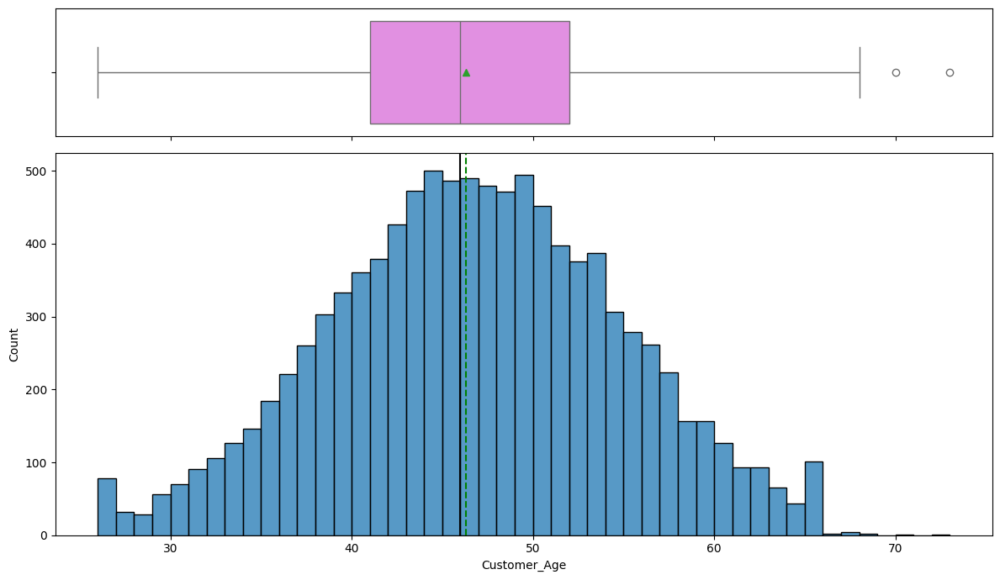

In [ ]:
# lets analyze customer's age
histogram_boxplot(df, 'Customer_Age')

Median age is about 45

Attrition_Flag_Existing Customer     0     1    All
Customer_Age                                       
All                               1627  8500  10127
43                                  85   388    473
48                                  85   387    472
44                                  84   416    500
46                                  82   408    490
45                                  79   407    486
49                                  79   416    495
47                                  76   403    479
41                                  76   303    379
50                                  71   381    452
54                                  69   238    307
40                                  64   297    361
42                                  62   364    426
53                                  59   328    387
52                                  58   318    376
51                                  58   340    398
55                                  51   228    279
39          

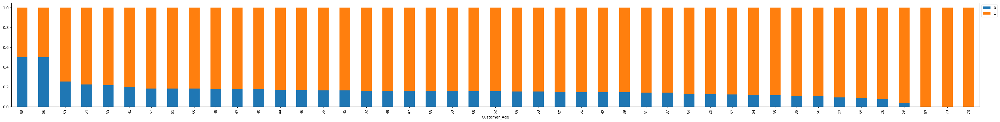

In [ ]:
# create a staked countplot of age and existing customer
stacked_barplot(df, 'Customer_Age', 'Attrition_Flag_Existing Customer')

In terms of attrited customers, most of the attrited customers are on the younger side (43-54). Existing customer are 44 -54 age.

## Dependent Count

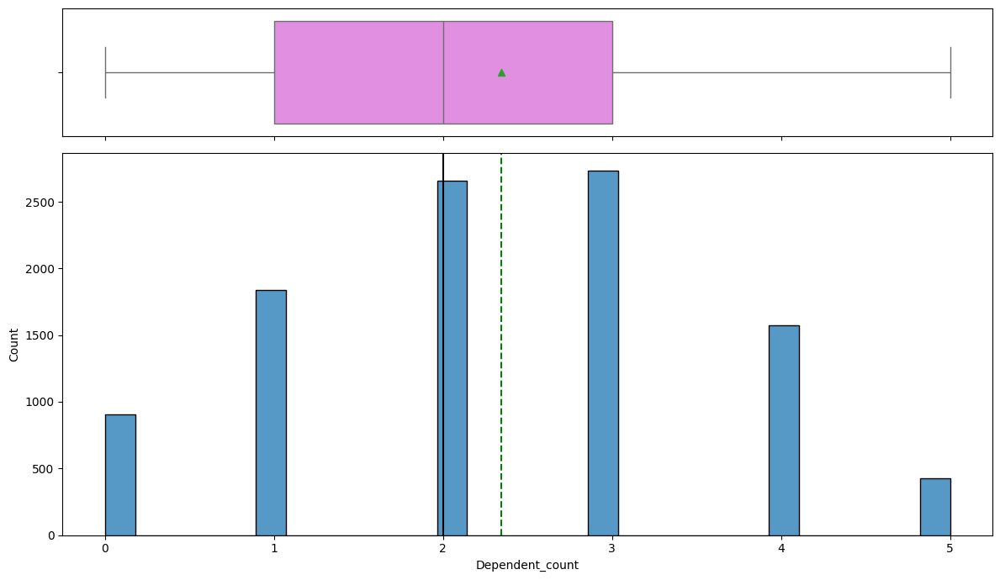

In [ ]:
histogram_boxplot(df, 'Dependent_count')

Attrition_Flag_Existing Customer     0     1    All
Dependent_count                                    
All                               1627  8500  10127
3                                  482  2250   2732
2                                  417  2238   2655
1                                  269  1569   1838
4                                  260  1314   1574
0                                  135   769    904
5                                   64   360    424
------------------------------------------------------------------------------------------------------------------------


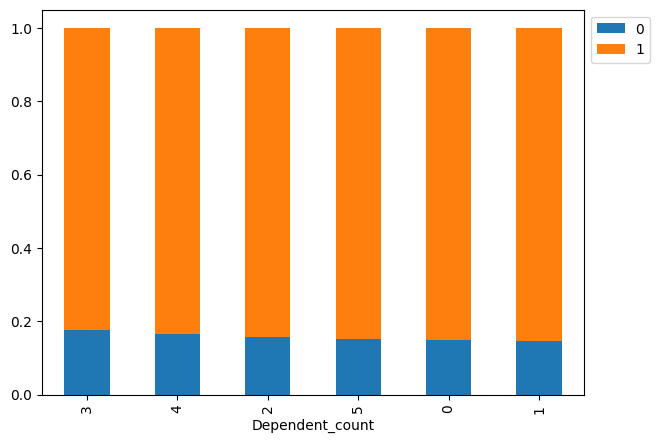

In [ ]:
# create a staked countplot of dependent and existing customer
stacked_barplot(df, 'Dependent_count', 'Attrition_Flag_Existing Customer')

Not much to report on.

## Months_on_book

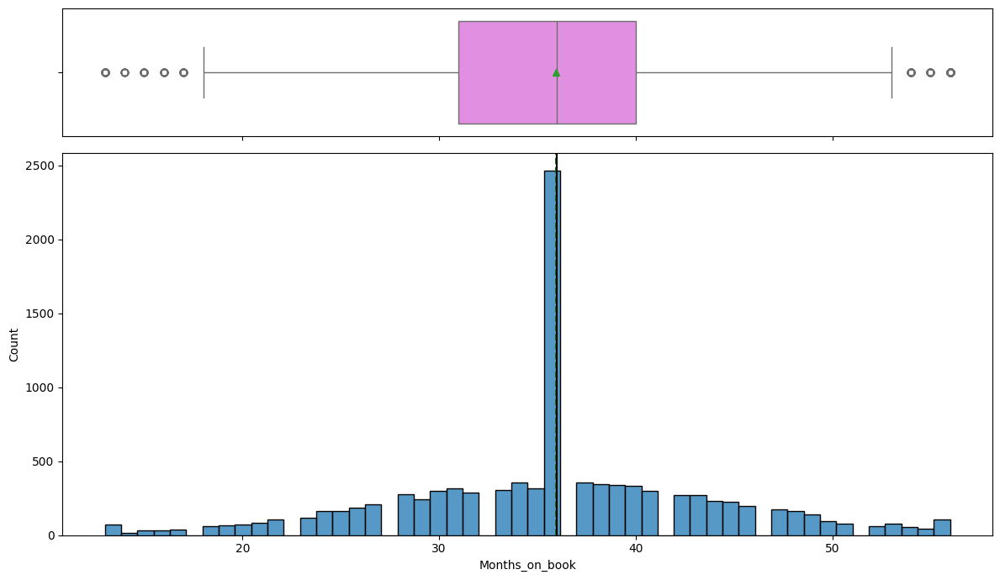

In [ ]:
# create boxplot of Months_on_book
histogram_boxplot(df, 'Months_on_book')

In [ ]:
df['Months_on_book'].mean()

35.928409203120374

Months on books is about 35

Attrition_Flag_Existing Customer     0     1    All
Months_on_book                                     
All                               1627  8500  10127
36                                 430  2033   2463
39                                  64   277    341
37                                  62   296    358
30                                  58   242    300
38                                  57   290    347
34                                  57   296    353
41                                  51   246    297
33                                  48   257    305
40                                  45   288    333
35                                  45   272    317
32                                  44   245    289
28                                  43   232    275
44                                  42   188    230
43                                  42   231    273
46                                  36   161    197
42                                  36   235    271
29          

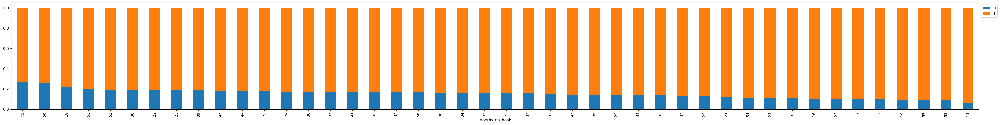

In [ ]:
# stacked bar plot between existing customers and attrited customers and the months
stacked_barplot(df, 'Months_on_book', 'Attrition_Flag_Existing Customer')

The attrited customers have a higher count when the months on the books is lower. Existing customers have a higher proportion as the months on books increases.

## Total Relationship Count

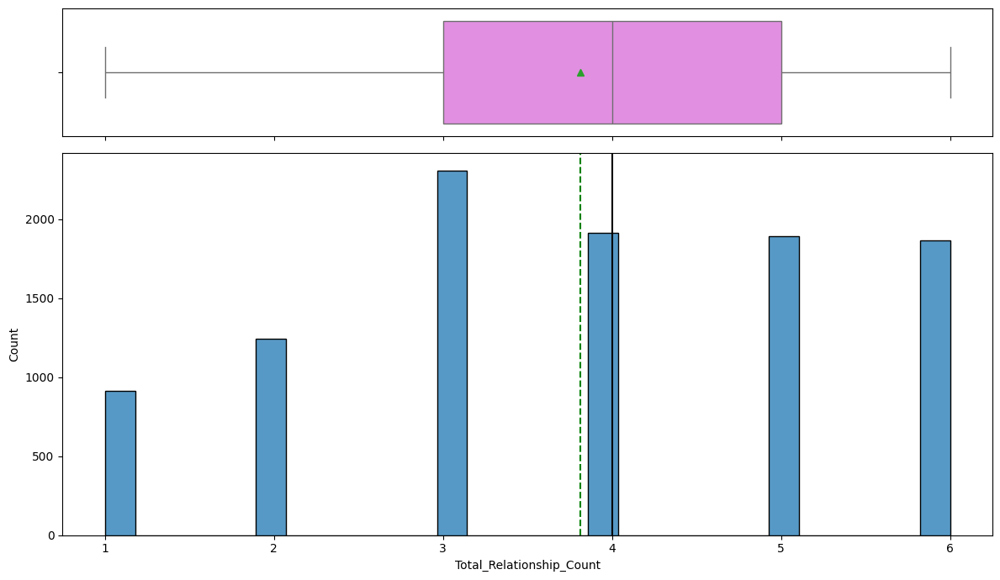

In [ ]:
# Total_Relationship_Count: Total no. of products held by the customer
# create a histogram of total relationship count
histogram_boxplot(df, 'Total_Relationship_Count')

Total relationship count is 4

Attrition_Flag_Existing Customer     0     1    All
Total_Relationship_Count                           
All                               1627  8500  10127
3                                  400  1905   2305
2                                  346   897   1243
1                                  233   677    910
5                                  227  1664   1891
4                                  225  1687   1912
6                                  196  1670   1866
------------------------------------------------------------------------------------------------------------------------


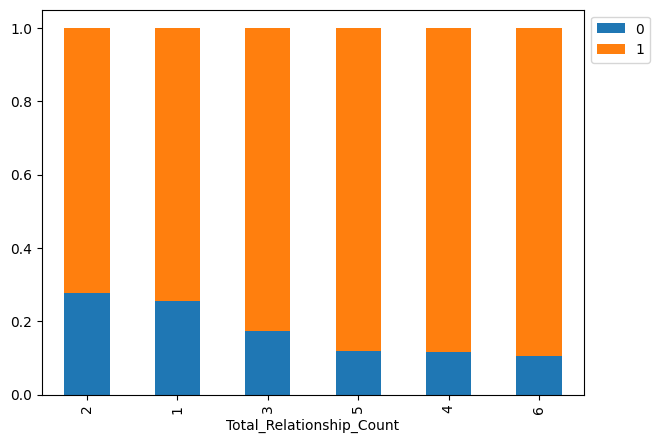

In [ ]:
# stacked plot between total relationship count v existing customer
stacked_barplot(df, 'Total_Relationship_Count', 'Attrition_Flag_Existing Customer')

two and one has the highest proportion of attrited customers. Meaning that the number of products a person who attrited is on the lower side.

## Contacts_Count_12_mon

No. of Contacts in the last 12 months

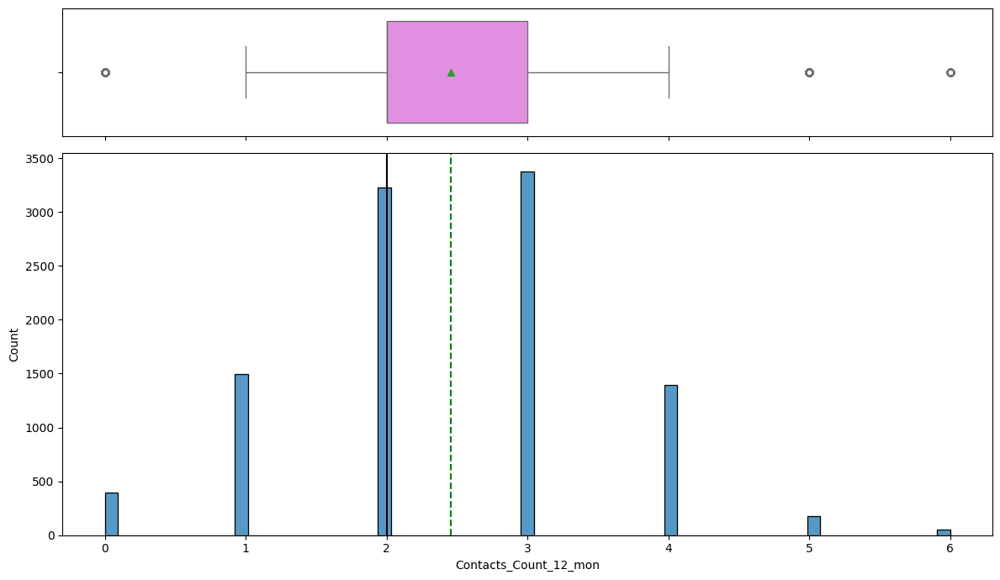

In [ ]:
# histplot of Contacts_Count_12_mon
histogram_boxplot(df, 'Contacts_Count_12_mon')

Median is around 2.5 contacts

Attrition_Flag_Existing Customer     0     1    All
Contacts_Count_12_mon                              
All                               1627  8500  10127
3                                  681  2699   3380
2                                  403  2824   3227
4                                  315  1077   1392
1                                  108  1391   1499
5                                   59   117    176
6                                   54     0     54
0                                    7   392    399
------------------------------------------------------------------------------------------------------------------------


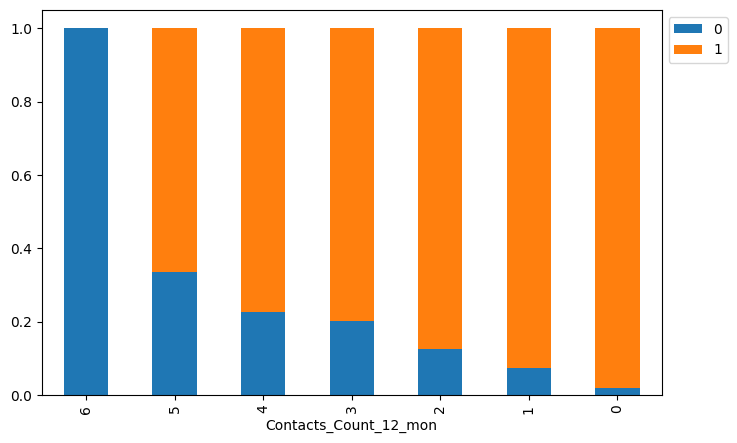

In [ ]:
# count plot of Contacts_Count_12_mon and existing customert
stacked_barplot(df, 'Contacts_Count_12_mon', 'Attrition_Flag_Existing Customer')

Highest proportion of attrited customers tends to have higher contacts.

## Credit Limit

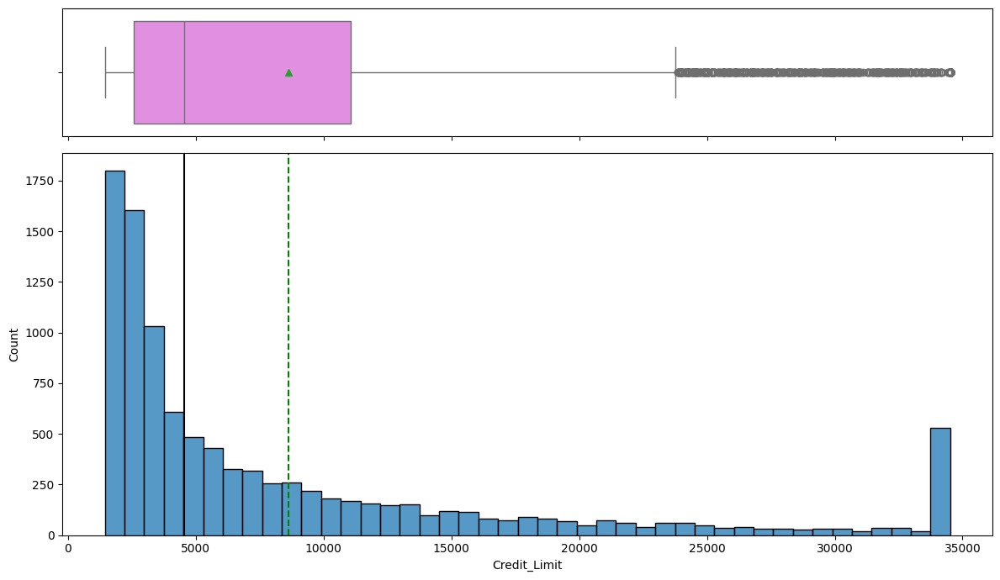

In [ ]:
# credit limit histogram
histogram_boxplot(df, 'Credit_Limit')

Right skewed. Median is around 5000

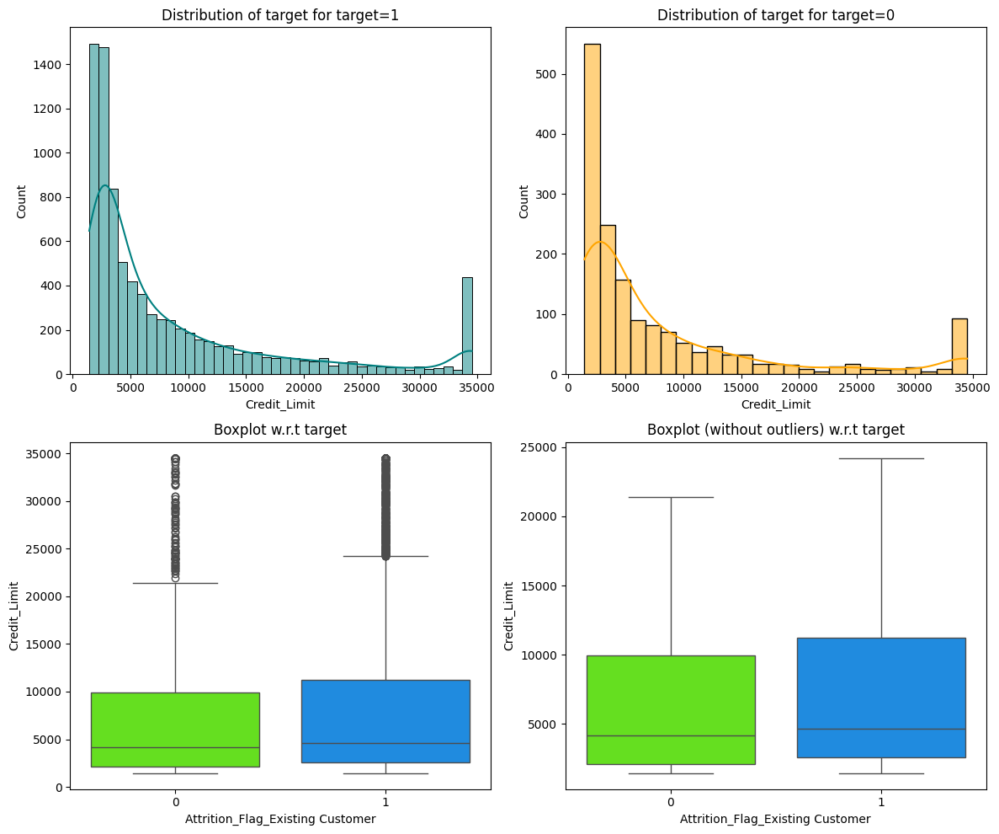

In [ ]:
# dist plot and credit limit v existing
distribution_plot_wrt_target(df, 'Credit_Limit', 'Attrition_Flag_Existing Customer')

Same shape with existing v attrited. (Right skewed). Existing customers have higher outliers than non existing customers

## Total_Revolving_Bal

Total_Revolving_Bal: Total Revolving Balance on the Credit Card

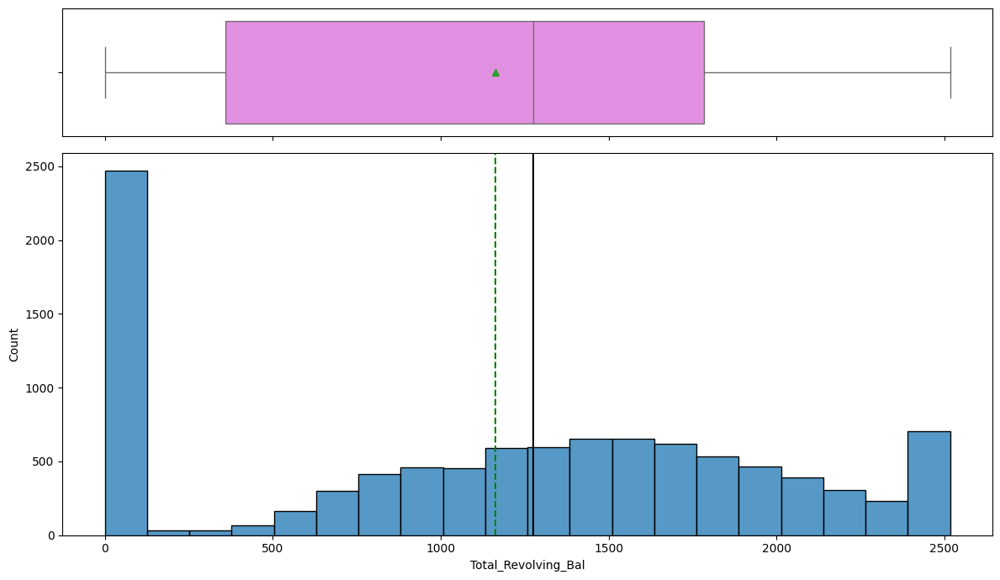

In [ ]:
# histogram total revolving balance
histogram_boxplot(df, 'Total_Revolving_Bal')

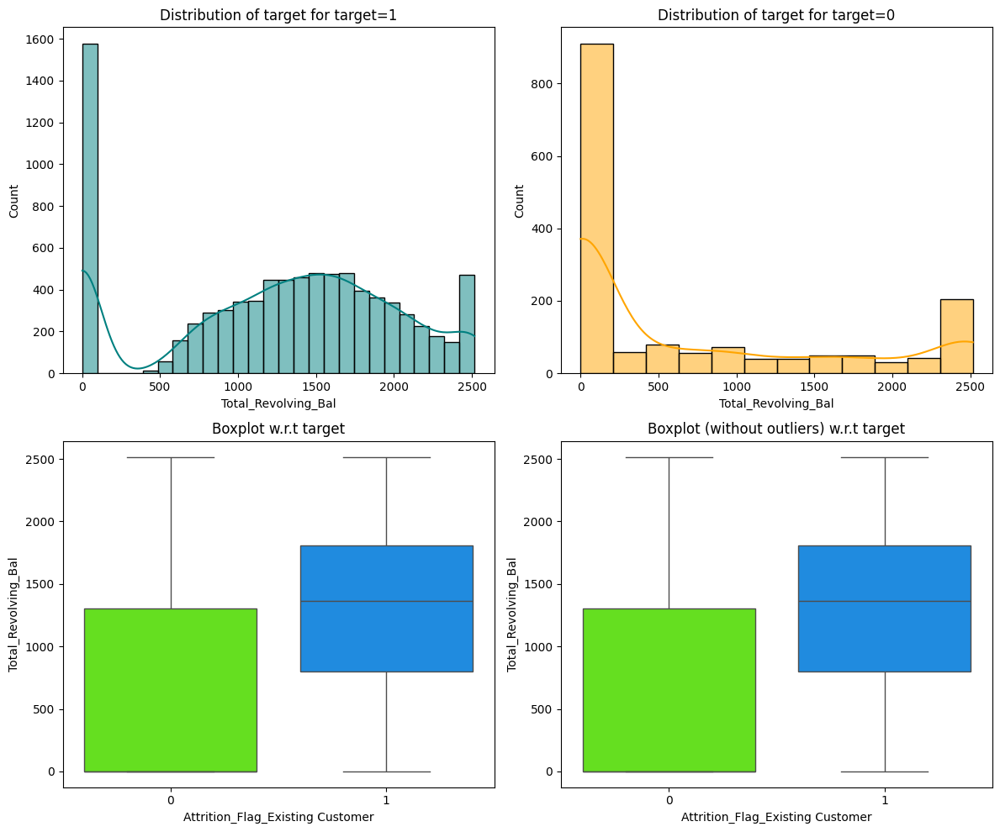

In [ ]:
# dist plot and credit limit v existing
distribution_plot_wrt_target(df, 'Total_Revolving_Bal', 'Attrition_Flag_Existing Customer')

Existing customers tend to have a higher revolving balance than attrited customers. Attrited customers either have majority 0-500 dollars in revolving balance or they have slightly lower than 2500.

## Avg_Open_To_Buy

Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)

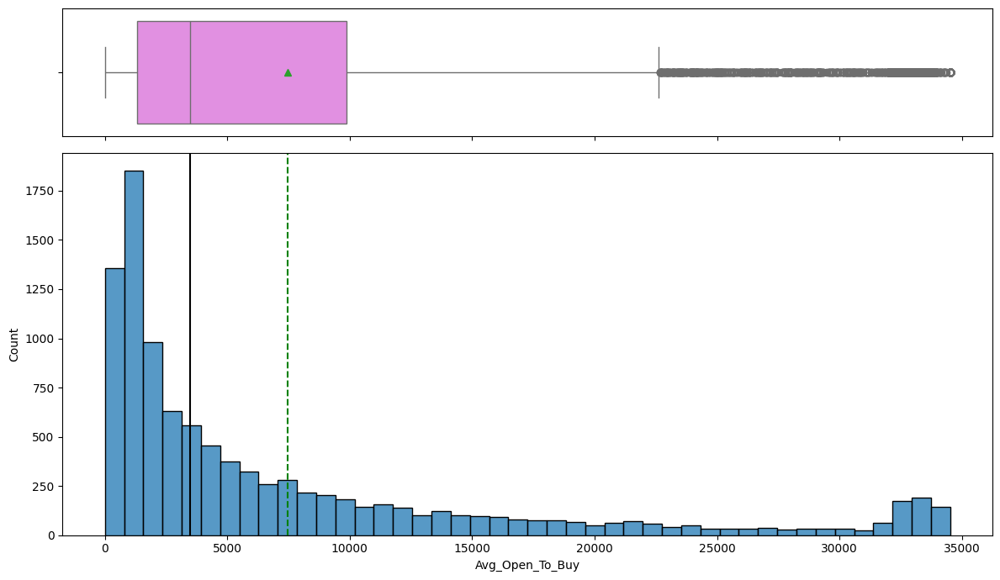

In [ ]:
# hist plot of Avg_Open_To_Buy
histogram_boxplot(df, 'Avg_Open_To_Buy')

Right skewed

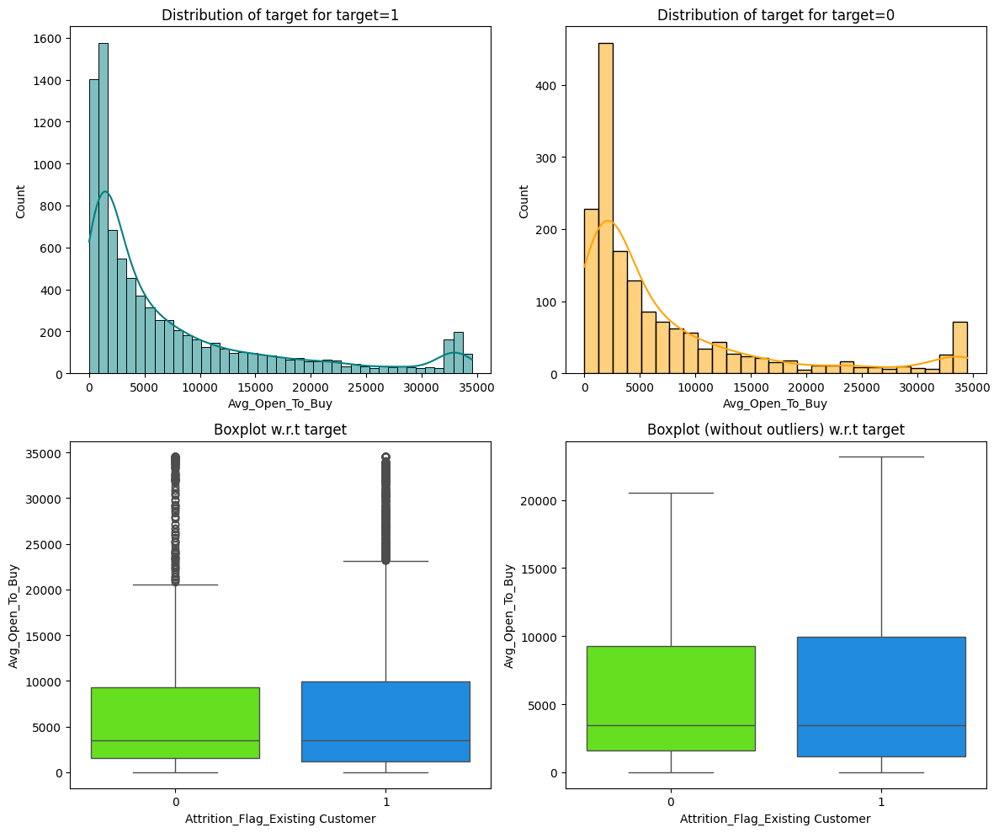

In [ ]:
 # dist plot and Avg_Open_To_Buy v existing
distribution_plot_wrt_target(df, 'Avg_Open_To_Buy', 'Attrition_Flag_Existing Customer')

Same right skewed shape between attrited customers and existing customer. Existing customers have more outliers

## Answer Q1 (Transaction Amount)

In [ ]:
df.Total_Trans_Amt.describe()

,Total_Trans_Amt
count,10127.000
mean,4404.086
std,3397.129
min,510.000
25%,2155.500
50%,3899.000
75%,4741.000
max,18484.000


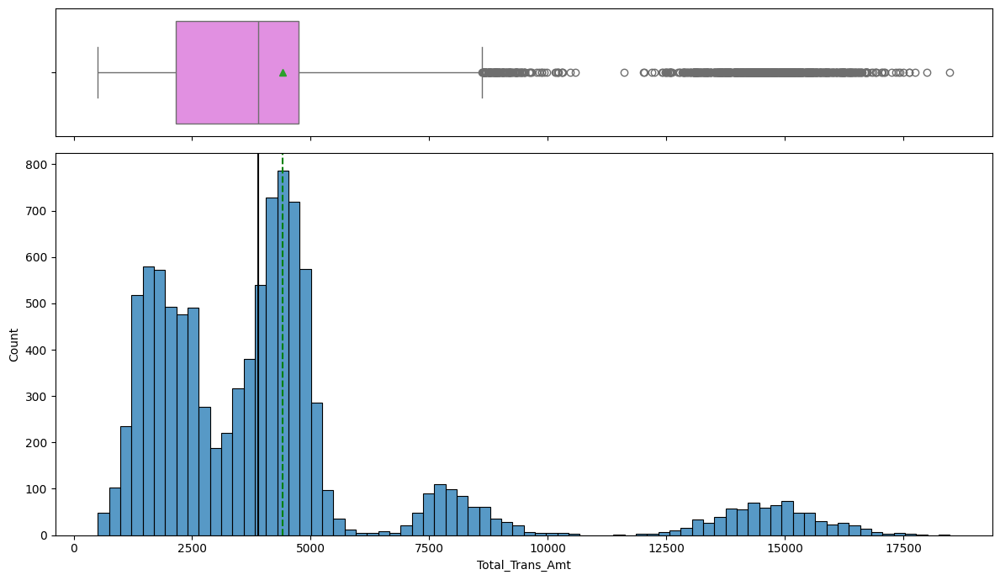

In [ ]:
histogram_boxplot(df, 'Total_Trans_Amt')

## Answer Q2 (education Level)

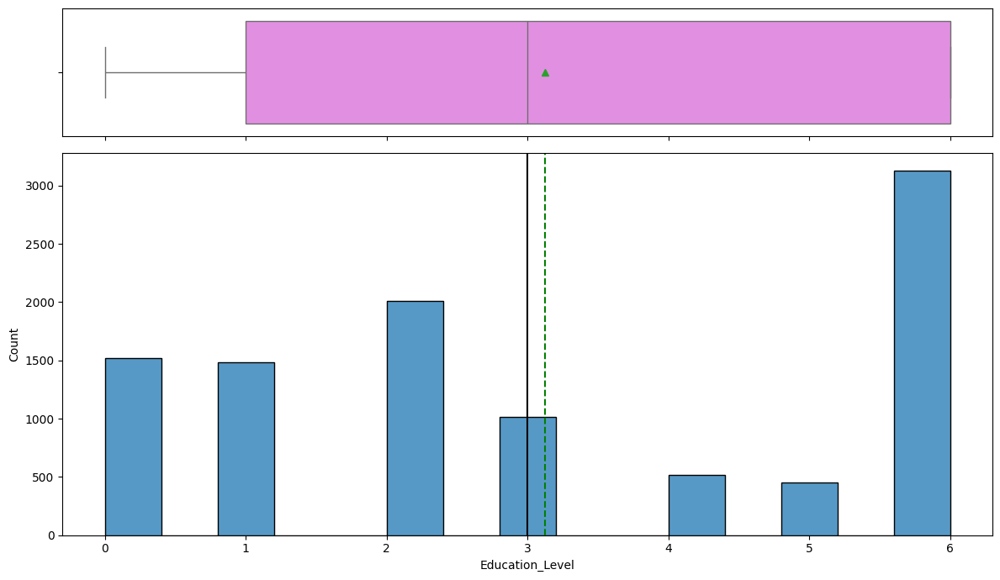

In [ ]:
histogram_boxplot(df, 'Education_Level')

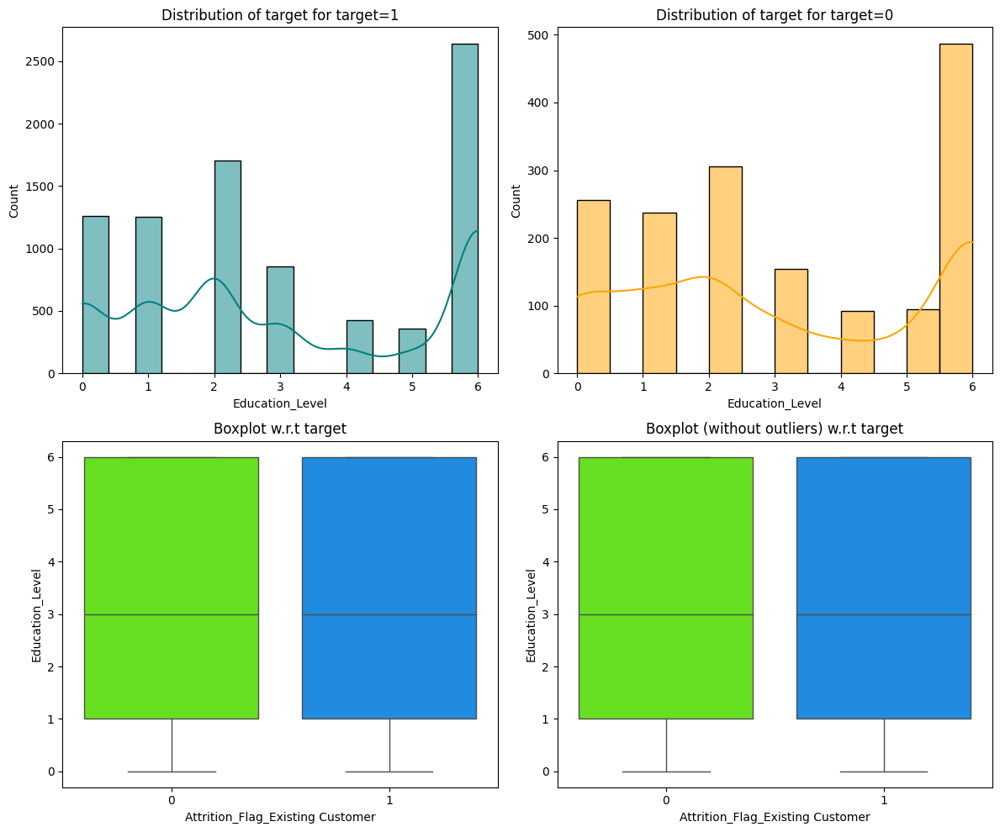

In [ ]:
distribution_plot_wrt_target(df, 'Education_Level', 'Attrition_Flag_Existing Customer')

Education has the same shape between attrited and existing customers.

##  Answer Q.3 (Income)

In [ ]:
df.Income_Category.value_counts()

,count
Income_Category,
1,3561
2,1790
4,1535
3,1402
0,1112
5,727


<Axes: xlabel='Income_Category'>

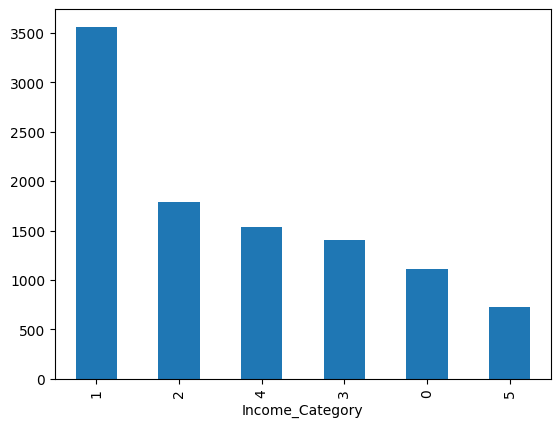

In [ ]:
df.Income_Category.value_counts().plot(kind='bar')

In [ ]:
df.Income_Category.mean()

2.0857114644020935

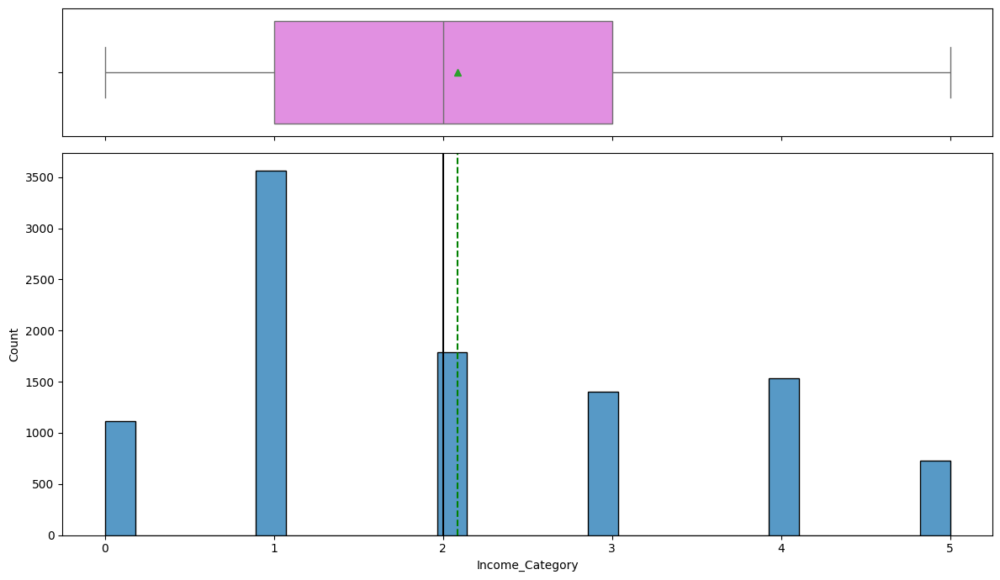

In [ ]:
histogram_boxplot(df,'Income_Category')

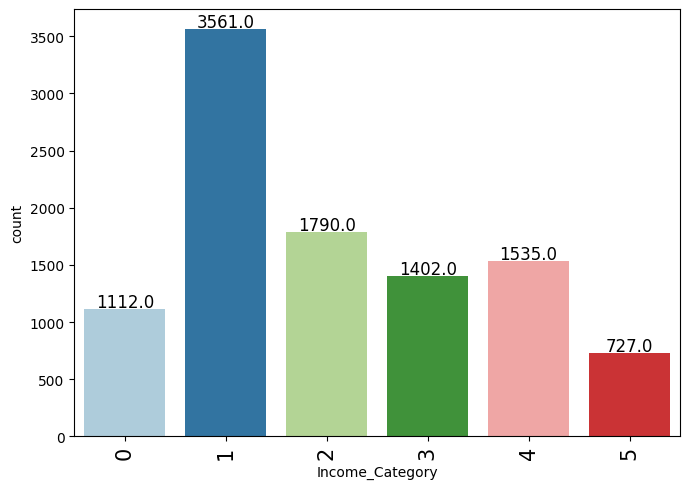

In [ ]:
labeled_barplot(df, 'Income_Category')

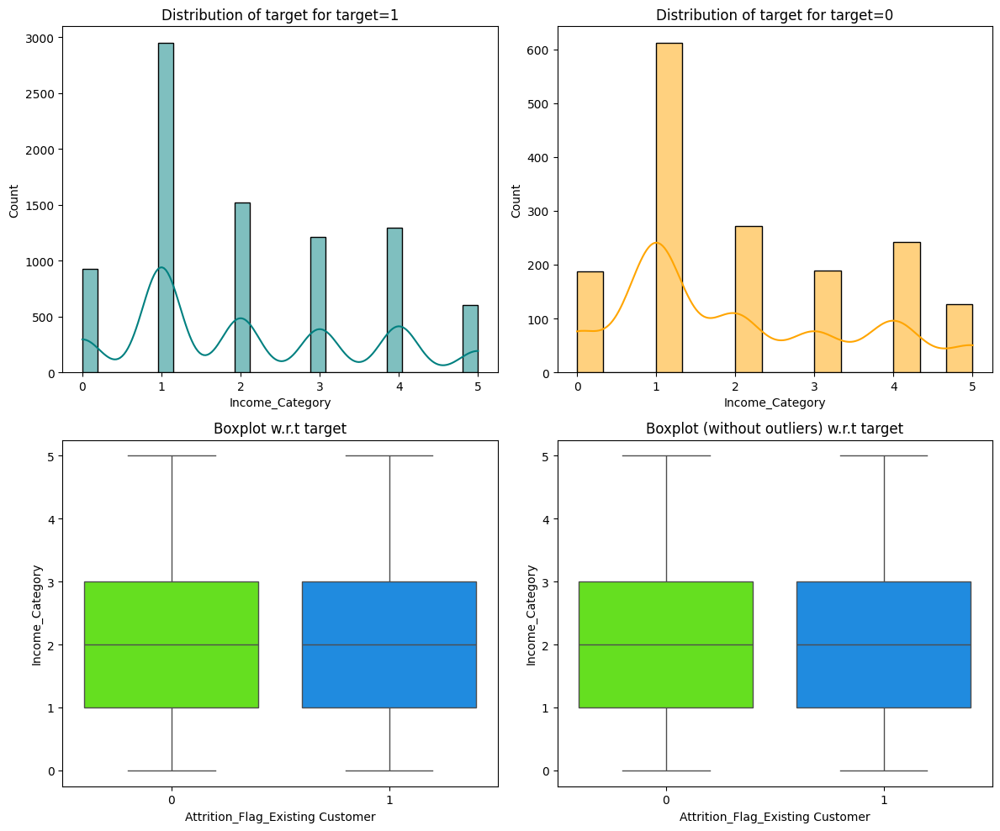

In [ ]:
distribution_plot_wrt_target(df, 'Income_Category', 'Attrition_Flag_Existing Customer')

## Q4 (total_ct_change_Q4_Q1)

How does the change in transaction amount between Q4 and Q1 (total_ct_change_Q4_Q1) vary by the customer's account status (Attrition_Flag)?

In [ ]:
df.Total_Ct_Chng_Q4_Q1.describe()

,Total_Ct_Chng_Q4_Q1
count,10127.000
mean,0.712
std,0.238
min,0.000
25%,0.582
50%,0.702
75%,0.818
max,3.714


In [ ]:
df['Attrition_Flag_Existing Customer'] = df['Attrition_Flag_Existing Customer'].astype(int)

In [ ]:
Attrited_Customer = df[df['Attrition_Flag_Existing Customer'] == 0]
Existing_Customer = df[df['Attrition_Flag_Existing Customer'] == 1]

In [ ]:
print(f"Attrited Customer: {len(Attrited_Customer)}")
print(f"Existing Customer: {len(Existing_Customer)}")

Attrited Customer: 1627
Existing Customer: 8500


In [ ]:
mean_attrited = Attrited_Customer['Total_Ct_Chng_Q4_Q1'].mean()
mean_existing = Existing_Customer['Total_Ct_Chng_Q4_Q1'].mean()

print(f"Mean Total_Ct_Chng_Q4_Q1 for Attrited Customer: {mean_attrited}")
print(f"Mean Total_Ct_Chng_Q4_Q1 for Existing Customer: {mean_existing}")

Mean Total_Ct_Chng_Q4_Q1 for Attrited Customer: 0.5543859864781807
Mean Total_Ct_Chng_Q4_Q1 for Existing Customer: 0.7424341176470589


In [ ]:
total_ct_change_Q4_Q1 = Attrited_Customer['Total_Ct_Chng_Q4_Q1'].mean() - Existing_Customer['Total_Ct_Chng_Q4_Q1'].mean()

In [ ]:
total_ct_change_Q4_Q1

-0.1880481311688782

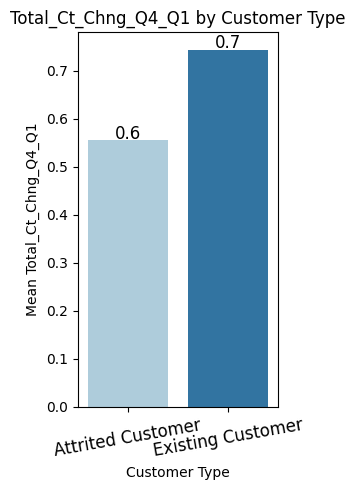

In [ ]:
# Adjust the barplot code above to show existing customer v attrited customer
def labeled_barplot(data, feature, target, perc=False, n=None):
    """
    Barplot with percentage or count at the top

    data: dataframe
    feature: dataframe column (categorical feature for grouping, e.g., Attrition)
    target: numerical column (e.g., Total_Ct_Chng_Q4_Q1 to show aggregate statistics)
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    # Create a new column to label the customer types (Attrited vs Existing)
    # I will drop this column because it is string.
    df['Customer_Type'] = df['Attrition_Flag_Existing Customer'].apply(
        lambda x: 'Existing Customer' if x == 1 else 'Attrited Customer')

    # Aggregate the data (group by customer type and calculate mean of the target variable)
    grouped_data = df.groupby('Customer_Type')[target].mean().reset_index()

    # Set up the plot size
    if n is None:
        plt.figure(figsize=(len(grouped_data) + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=10, fontsize=12)
    ax = sns.barplot(
        data=grouped_data,
        x='Customer_Type',
        y=target,
        palette="Paired"
    )

    # Annotate bars with values (percentage or count)
    for p in ax.patches:
        if perc:
            label = "{:.1f}%".format(100 * p.get_height() / data[target].sum())
        else:
            label = "{:.1f}".format(p.get_height())  # mean of Total_Ct_Chng_Q4_Q1

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the value (mean of Total_Ct_Chng_Q4_Q1)

    # Add labels and title
    plt.title(f'{target} by Customer Type')
    plt.xlabel('Customer Type')
    plt.ylabel(f'Mean {target}')

    plt.tight_layout()
    plt.show()  # Show the plot

# Example usage:
labeled_barplot(df, 'Customer_Type', 'Total_Ct_Chng_Q4_Q1', perc=False)


In [ ]:
# df.drop('Customer_Type', axis=1, errors='ignore', inplace=True)

## Q5 (Months_Inactive_12_mon)

How does the number of months a customer was inactive in the last 12 months (Months_Inactive_12_mon) vary by the customer's account status (Attrition_Flag)?

In [ ]:
df['Months_Inactive_12_mon'].describe()

,Months_Inactive_12_mon
count,10127.000
mean,2.341
std,1.011
min,0.000
25%,2.000
50%,2.000
75%,3.000
max,6.000


The mean number of months between both attrition and existing customers is 2.3 months. Lets look at each type of custome more in detail

Attrition = 0, Existing = 1

In [ ]:
# Inactive v. Attrition Customer
df.groupby(['Attrition_Flag_Existing Customer', 'Months_Inactive_12_mon'])['Months_Inactive_12_mon'].count()

Attrition_Flag_Existing Customer  Months_Inactive_12_mon
0                                 0                           15
                                  1                          100
                                  2                          505
                                  3                          826
                                  4                          130
                                  5                           32
                                  6                           19
1                                 0                           14
                                  1                         2133
                                  2                         2777
                                  3                         3020
                                  4                          305
                                  5                          146
                                  6                          105
Name: Months_Inactive_12_mon, dtype: int64

In [ ]:
# average number of months inactive when attrited
Attrited_Customer['Months_Inactive_12_mon'].mean()

2.693300553165335

In [ ]:
# average number of months inactive when existing customer
Existing_Customer['Months_Inactive_12_mon'].mean()

2.273764705882353

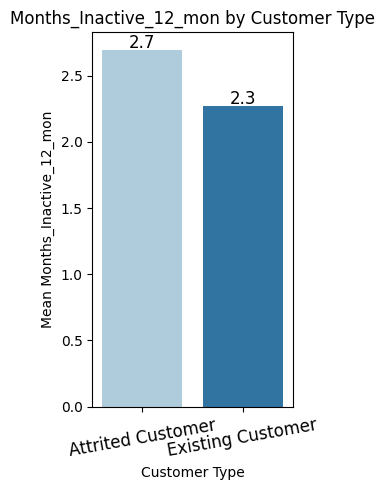

In [ ]:
labeled_barplot(df, 'Customer_Type', 'Months_Inactive_12_mon', perc=False)

Attrited Customers on average have slightly higher inactive months

In [ ]:
df.drop('Customer_Type', axis=1, errors='ignore', inplace=True)

## Q6

What are the attributes that have a strong correlation with each other?

Below is a list of all of the correlations that exist within the data frame

In [ ]:
# find correlation
df.corr()

,Customer_Age,Dependent_count,Education_Level,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_Mapped,Attrition_Flag_Existing Customer,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
Customer_Age,1.000,-0.122,-0.002,0.024,0.789,-0.011,0.054,-0.018,0.002,0.015,0.001,-0.062,-0.046,-0.067,-0.012,0.007,-0.002,-0.018,-0.017,0.047,-0.011,-0.027,-0.012,0.007,-0.019
Dependent_count,-0.122,1.000,0.000,0.066,-0.103,-0.039,-0.011,-0.041,0.068,-0.003,0.068,-0.035,0.025,0.050,0.011,-0.037,0.000,-0.019,0.005,0.014,-0.041,0.042,0.027,0.004,0.017
Education_Level,-0.002,0.000,1.000,-0.013,0.006,0.002,0.007,-0.003,-0.004,-0.004,-0.003,-0.010,-0.004,-0.002,-0.012,0.002,1.000,0.001,-0.006,0.016,-0.015,-0.005,0.003,0.012,0.013
Income_Category,0.024,0.066,-0.013,1.000,0.022,-0.003,-0.016,0.023,0.476,0.035,0.473,0.011,0.020,-0.055,-0.013,-0.246,-0.013,0.014,0.787,0.024,-0.025,0.009,0.046,0.006,0.067
Months_on_book,0.789,-0.103,0.006,0.022,1.000,-0.009,0.074,-0.011,0.008,0.009,0.007,-0.049,-0.039,-0.050,-0.014,-0.008,0.006,-0.014,-0.007,0.033,-0.005,-0.026,-0.005,0.002,-0.014
Total_Relationship_Count,-0.011,-0.039,0.002,-0.003,-0.009,1.000,-0.004,0.055,-0.071,0.014,-0.073,0.050,-0.347,-0.242,0.041,0.068,0.002,0.150,0.003,0.017,-0.017,-0.009,-0.056,-0.043,-0.061
Months_Inactive_12_mon,0.054,-0.011,0.007,-0.016,0.074,-0.004,1.000,0.029,-0.020,-0.042,-0.017,-0.032,-0.037,-0.043,-0.039,-0.008,0.007,-0.152,-0.011,-0.007,0.009,-0.005,-0.003,-0.004,-0.016
Contacts_Count_12_mon,-0.018,-0.041,-0.003,0.023,-0.011,0.055,0.029,1.000,0.021,-0.054,0.026,-0.024,-0.113,-0.152,-0.095,-0.055,-0.003,-0.204,0.040,0.002,0.008,-0.010,-0.001,0.002,-0.001
Credit_Limit,0.002,0.068,-0.004,0.476,0.008,-0.071,-0.020,0.021,1.000,0.042,0.996,0.013,0.172,0.076,-0.002,-0.483,-0.004,0.024,0.421,-0.057,0.032,0.025,0.234,0.106,0.441
Total_Revolving_Bal,0.015,-0.003,-0.004,0.035,0.009,0.014,-0.042,-0.054,0.042,1.000,-0.047,0.058,0.064,0.056,0.090,0.624,-0.004,0.263,0.030,0.039,-0.038,-0.002,0.024,0.006,0.013


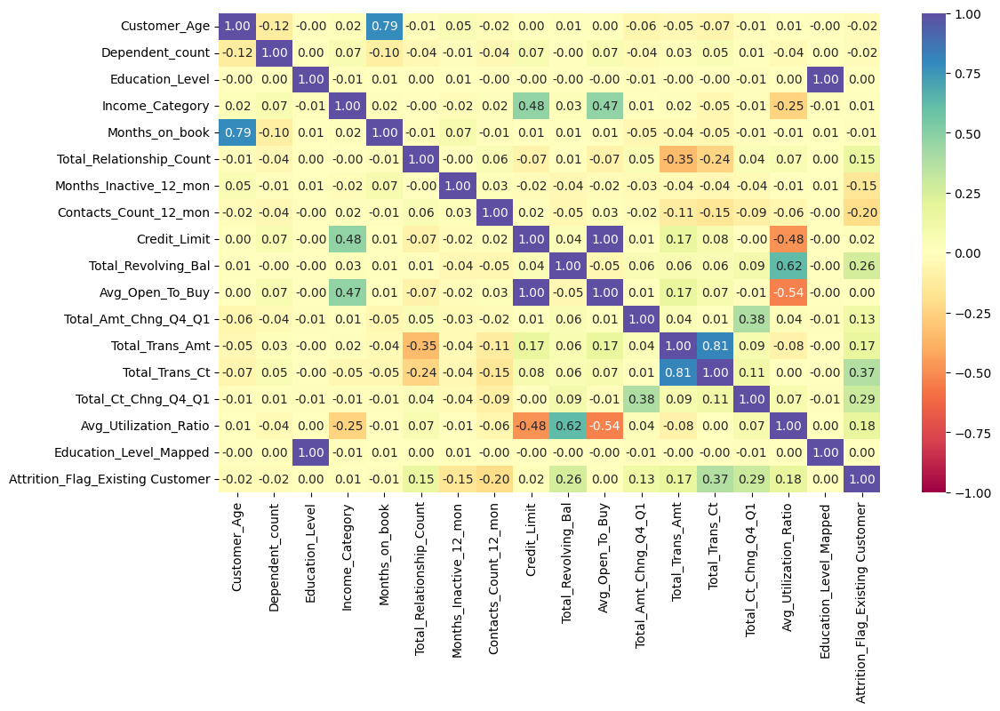

In [ ]:
# use correlation test
# defining the size of the plot
num_features = [
    'Customer_Age', 'Dependent_count', 'Education_Level', 'Income_Category',
    'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
    'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
    'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
    'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
    'Education_Level_Mapped', 'Attrition_Flag_Existing Customer'
]
data_subset = df[num_features]

# Create the correlation matrix for the selected features or the entire dataset
corr_matrix = data_subset.corr()

# Define the size of the plot
plt.figure(figsize=(12, 7))

# Plot the heatmap for the correlation matrix
sns.heatmap(
    corr_matrix, annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)

# Show the plot
plt.show()

I wanted to find what 2 variables are the most correlated so I can focus in on the variables that are related

In [ ]:
# find correlation
corr_matrix = df.corr()

# correlation pairs
corr_pairs = corr_matrix.unstack().sort_values(kind="quicksort")
corr_pairs = corr_pairs[corr_pairs != 1]

# sort pairs by absolute value and get top 5 most correlated pairs
top_corr_pairs = corr_pairs.abs().sort_values(ascending=False).head(10)
top_corr_pairs

,,0
Credit_Limit,Avg_Open_To_Buy,0.996
Avg_Open_To_Buy,Credit_Limit,0.996
Total_Trans_Ct,Total_Trans_Amt,0.807
Total_Trans_Amt,Total_Trans_Ct,0.807
Customer_Age,Months_on_book,0.789
Months_on_book,Customer_Age,0.789
Gender_M,Income_Category,0.787
Income_Category,Gender_M,0.787
Marital_Status_Married,Marital_Status_Single,0.741
Marital_Status_Single,Marital_Status_Married,0.741


It seems like Avg_Open_To_Buy and Credit_Limit are the most correlated,
second is Customer Age and Months on Books,
Third is Gender_M and Income_Category,


Here is a breakdown of all the variables

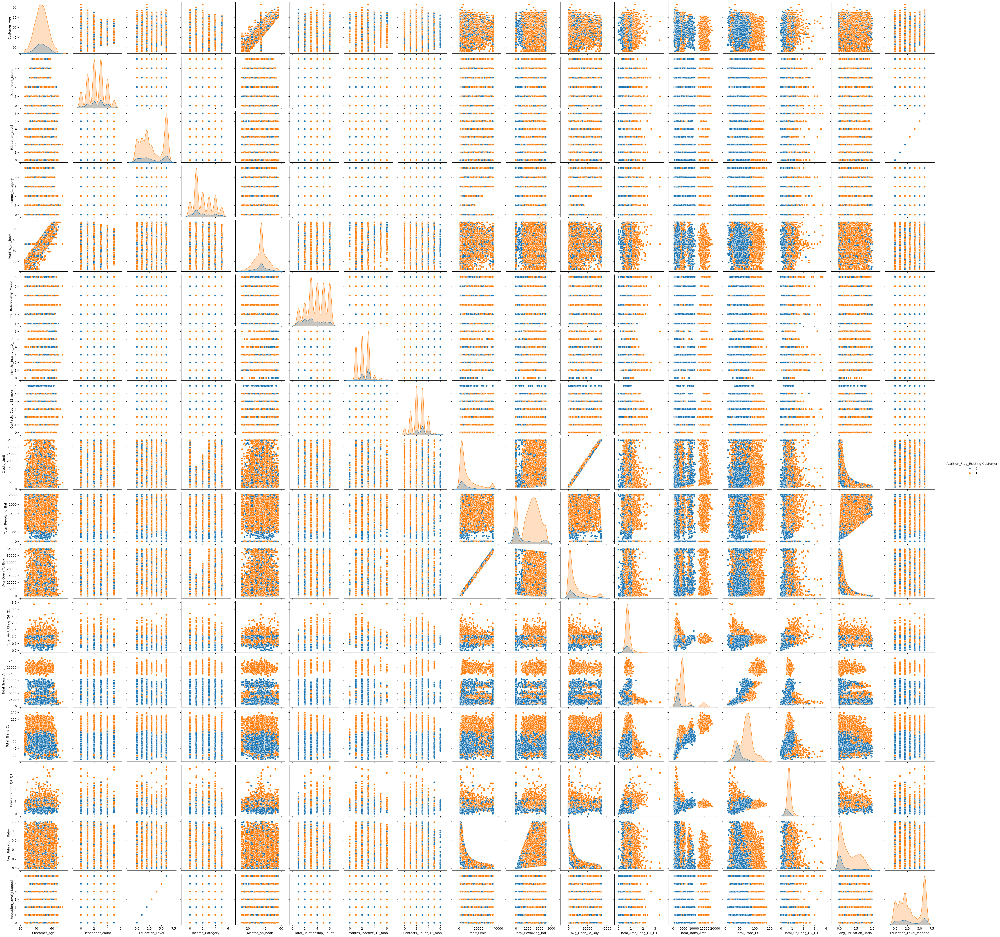

In [ ]:
# Pair plot
sns.pairplot(data=data_subset, hue="Attrition_Flag_Existing Customer")
plt.show()

# Data Pre-processing

In [ ]:
df['Attrition_Flag_Existing Customer'].value_counts()

,count
Attrition_Flag_Existing Customer,
1,8500
0,1627


The minority group is the attrited group (Marked as 0). I will make sure to address this in the oversampling section

In [ ]:
X = df.drop('Attrition_Flag_Existing Customer', axis=1)
y = df['Attrition_Flag_Existing Customer']

In [ ]:
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

# then split the temporary set into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 24) (2026, 24) (2026, 24)


## Missing value imputation




Since the values that were null were mapped/one hot encoded, I can move on to the next section.

# Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

## Model Building with original data

Sample code for model building with original data

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state = 1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

# Lists to store performance metrics for each model
train_performance = pd.DataFrame(columns=["Models", "Accuracy", "Recall", "Precision", "F1"])
val_performance = pd.DataFrame(columns=["Models", "Accuracy", "Recall", "Precision", "F1"])

# Training Performance (on the training set)
print("\nTraining Performance:\n")
for name, model in models:
    model.fit(X_train, y_train)  # Train on the training set
    performance = model_performance_classification_sklearn(model, X_train, y_train)  # Get performance on training set
    performance["Models"] = name
    train_performance = pd.concat([train_performance, performance], ignore_index=True)
    print(f"{name}: {performance}")

# Validation Performance (on the validation set)
print("\nValidation Performance:\n")
for name, model in models:
    model.fit(X_train, y_train)  # Train on the training set
    performance = model_performance_classification_sklearn(model, X_val, y_val)  # Get performance on validation set
    performance["Models"] = name
    val_performance = pd.concat([val_performance, performance], ignore_index=True)
    print(f"{name}: {performance}")

# Displaying the full performance results for both training and validation
print("\nSummary of Training Performance:\n", train_performance)
print("\nSummary of Validation Performance:\n", val_performance)


Training Performance:

Bagging:    Accuracy  Recall  Precision    F1   Models
0     0.997   0.997      0.999 0.998  Bagging
Random forest:    Accuracy  Recall  Precision    F1         Models
0     1.000   1.000      1.000 1.000  Random forest
GBM:    Accuracy  Recall  Precision    F1 Models
0     0.978   0.992      0.982 0.987    GBM
Adaboost:    Accuracy  Recall  Precision    F1    Models
0     0.942   0.984      0.949 0.966  Adaboost
XGBoost:    Accuracy  Recall  Precision    F1   Models
0     1.000   1.000      1.000 1.000  XGBoost
dtree:    Accuracy  Recall  Precision    F1 Models
0     1.000   1.000      1.000 1.000  dtree

Validation Performance:

Bagging:    Accuracy  Recall  Precision    F1   Models
0     0.952   0.980      0.964 0.972  Bagging
Random forest:    Accuracy  Recall  Precision    F1         Models
0     0.949   0.985      0.956 0.970  Random forest
GBM:    Accuracy  Recall  Precision    F1 Models
0     0.961   0.988      0.966 0.977    GBM
Adaboost:    Accuracy  R

Summary of Model Performance
**Bagging:**
Training: Near-perfect accuracy (0.997), recall (0.997), precision (0.999), and F1 score (0.998).
Validation: Accuracy drops to 0.952, but recall (0.980) remains high, indicating overfitting.
Conclusion: Overfitting, performs well on training but struggles with generalization.

**Random Forest:**
Training: Perfect scores across all metrics (1.000).
Validation: Accuracy drops to 0.949, recall (0.985) remains strong, but precision drops slightly.
Conclusion: Overfitting, high performance on training but some loss in validation.

**Gradient Boosting (GBM):**
Training: Accuracy of 0.978, with good recall (0.992) and precision (0.982).
Validation: Accuracy increases slightly to 0.961, with minimal drops in recall (0.988) and precision.
Conclusion: Good generalization, minor drop from training to validation.

**AdaBoost:**
Training: Accuracy of 0.942, high recall (0.984) but lower precision (0.949).
Validation: Accuracy drops to 0.934, with a slight drop in recall and precision.
Conclusion: Performs well but with a noticeable drop in accuracy and precision on validation.

**XGBoost:**
Training: Perfect performance (1.000).
Validation: Accuracy drops slightly to 0.969, recall (0.989) and precision (0.974) remain high.
Conclusion: Best generalization with minimal performance drop, robust model.

**Decision Tree:**
Training: Perfect performance (1.000).
Validation: Accuracy drops significantly to 0.931, with drops in recall and precision. Conclusion: Highly overfitted, needs tuning to improve generalization.
Final Thoughts:


Best Generalization: XGBoost and Gradient Boosting show the best balance of training and validation performance.
Overfitting: Random Forest, Bagging, and Decision Tree are overfitted, performing well on training but losing accuracy on validation.
AdaBoost: Good overall performance but with some drop in validation metrics.

Here are the differences in performance (example: training accuracy - validation accuracy)

In [ ]:
# Initialize performance_diff as a DataFrame outside of the loop
performance_diff = pd.DataFrame(columns=["Models", "Accuracy Diff", "Recall Diff", "Precision Diff", "F1 Diff"])

# Calculate differences between training and test performance
for idx, row in train_performance.iterrows():
    model_name = row["Models"]

    # Check if the model exists in the test performance DataFrame
    if model_name in val_performance["Models"].values:
        # Find the corresponding test performance row
        test_row = val_performance[val_performance["Models"] == model_name].iloc[0]

        # Calculate the differences for each metric
        acc_diff = row["Accuracy"] - test_row["Accuracy"]
        recall_diff = row["Recall"] - test_row["Recall"]
        precision_diff = row["Precision"] - test_row["Precision"]
        f1_diff = row["F1"] - test_row["F1"]

        # Create a new DataFrame for the row of differences
        diff_row = pd.DataFrame({
            "Models": [model_name],
            "Accuracy Diff": [acc_diff],
            "Recall Diff": [recall_diff],
            "Precision Diff": [precision_diff],
            "F1 Diff": [f1_diff]
        })

        # Concatenate the new row to the performance_diff DataFrame
        performance_diff = pd.concat([performance_diff, diff_row], ignore_index=True)
    else:
        print(f"Model {model_name} not found in test performance DataFrame.")

# Display the summary of performance differences
print("\nSummary of performance differences (Training - Validation):\n", performance_diff)





Summary of performance differences (Training - Validation):
           Models  Accuracy Diff  Recall Diff  Precision Diff  F1 Diff
0        Bagging          0.045        0.017           0.035    0.027
1  Random forest          0.051        0.015           0.044    0.030
2            GBM          0.017        0.004           0.016    0.010
3       Adaboost          0.007       -0.001           0.009    0.004
4        XGBoost          0.031        0.011           0.026    0.018
5          dtree          0.069        0.039           0.043    0.041


Adaboost has the most consistent scores between training and validation. This is most likely going to be the model that performs the best
Gradiant boost also performs very well.
Random forest has the biggest drop between training and validation across all criteria

Main Takeaways:
The Bagging, Random Forest, and XGBoost models seem to offer the best balance between training and validation performance, while Adaboost performs well but with a slight drop. The Decision Tree is the most overfitted model, showing the largest performance gap.

Let's econtinue to improve the model's performance

## Model Building with Oversampled data


One technique in providing more data to an underssampled minority group is called SMOTE or Synthetic Minority Oversampling. SMOTE synthesizes exisiting elements in a minority class by plotting a k-nearest neighbor. SMOTE adds synthetic points between two chosen points.

In [ ]:
df['Attrition_Flag_Existing Customer'].value_counts()

,count
Attrition_Flag_Existing Customer,
1,8500
0,1627


The minority group is not balanced with the majority group. Lets apply SMOTE to the model

In [ ]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [ ]:
X_train_over.shape

(10198, 24)

In [ ]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before OverSampling, count of label '1': 5099
Before OverSampling, count of label '0': 976 

After OverSampling, count of label '1': 5099
After OverSampling, count of label '0': 5099 

After OverSampling, the shape of train_X: (10198, 24)
After OverSampling, the shape of train_y: (10198,) 



The minority group (attrited) is now balanced

In [ ]:
# lets def a function that applies SMOTE to all models
def apply_smote(model, X_train, y_train):
    sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
    X_train_over, y_train_over = sm.fit_resample(X_train, y_train)
    model.fit(X_train_over, y_train_over)
    return model

In [ ]:
# Train each model after applying SMOTE and evaluate on the test set
print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))




Training Performance:

Bagging: 0.9949009609727397
Random forest: 1.0
GBM: 0.9735242204353795
Adaboost: 0.9315552069033144
XGBoost: 1.0
dtree: 1.0

Validation Performance:

Bagging: 0.9570588235294117
Random forest: 0.97
GBM: 0.97
Adaboost: 0.9358823529411765
XGBoost: 0.9805882352941176
dtree: 0.9452941176470588


Main Takeaways from using Smote:
Bagging: Training performance is strong (0.995), but there’s a noticeable drop in validation performance (0.957). This indicates that Bagging is slightly overfitting, but still performs well on unseen data.

Random Forest: Shows perfect training performance (1.0) and a slight drop in validation (0.970). While the model is performing well overall, the small performance drop suggests it could benefit from further tuning to improve generalization.

GBM: Performance is good on both training (0.974) and validation (0.970), with only a slight decrease in validation accuracy. This suggests GBM has a good balance between fitting the training data and generalizing well to unseen data.

Adaboost: While Adaboost performs reasonably well during training (0.932), the drop to 0.936 in validation accuracy is small but consistent with the model's tendency to overfit. The model is still quite effective, but it could be improved to better generalize.

XGBoost: Shows perfect training performance (1.0) and performs very well on the validation set (0.981). This indicates that XGBoost is highly effective at both fitting the training data and generalizing to unseen data.

Decision Tree (dtree): The Decision Tree shows perfect training performance (1.0) but has a noticeable drop in validation accuracy (0.945). This suggests overfitting, and the model would likely benefit from further pruning or hyperparameter tuning to improve generalization.

Best performing models:
- XGBoost and Random Forest have the highest accuracy, with excellent precision, recall, and f1.
- Bagging and GBM also performed well, strong metrics for class 1 (majority)

Underperforming:
Adaboost: low precision for class 0, but still performed well for class 1. Decent performance but lower compared to other models in terms of evaluating F1-score for class 0


TLDR:
XGBoost performs the best overall, maintaining high performance on both training and validation sets.
Random Forest and GBM are also strong, but with slight overfitting.
Bagging and Adaboost show slightly lower performance on validation but are still effective.
Decision Tree is the most overfitted and needs adjustments to improve its generalization.

## Model Building with Undersampled data

Undersample removes instances of majority class. In this case, the majority class is existing customers.

Random under sample does 1 minority data point to 1 majority data point. So it is equal.

In [ ]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [ ]:
# print out original shape versus undersampled shape
print(f"Originial Shape of X_train: {X_train.shape}")
print(f"Originial Shape of y_train: {y_train.shape}")
print(f"Shape of undersampled: {X_train_un.shape}")
print(f"Shape of undersampled: {y_train_un.shape}")

Originial Shape of X_train: (6075, 24)
Originial Shape of y_train: (6075,)
Shape of undersampled: (1952, 24)
Shape of undersampled: (1952,)


The number is lower

In [ ]:
# Define a function that applies random under-sampling to each model.
def apply_random_under_sample(model, X_train, y_train):
    # Random undersampler for under-sampling the data
    rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
    X_train_un, y_train_un = rus.fit_resample(X_train, y_train)  # Apply resampling on training data
    model.fit(X_train_un, y_train_un)  # Fit model with undersampled data
    return model


In [ ]:
# Train each model for random under-sample and evaluate on the test set
print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.9959016393442623
Random forest: 1.0
GBM: 0.9672131147540983
Adaboost: 0.9077868852459017
XGBoost: 1.0
dtree: 1.0

Validation Performance:

Bagging: 0.9258823529411765
Random forest: 0.9405882352941176
GBM: 0.9476470588235294
Adaboost: 0.9147058823529411
XGBoost: 0.9647058823529412
dtree: 0.9188235294117647


Main Takeaways from using Random Undersampling:
Bagging: Strong training performance (0.996), but validation drops to 0.926, indicating slight overfitting. Still performs well on unseen data.

Random Forest: Perfect training performance (1.0) and good validation performance (0.941). Slight overfitting, but still a solid model for validation.

GBM: Training performance (0.967) shows good learning, with a slight decrease in validation (0.948). Generalizes well without significant overfitting.

Adaboost: Training performance (0.908) is lower compared to others, but performs well on validation (0.915). Shows a good balance but could be further tuned.

XGBoost: Excellent training performance (1.0) and strong validation performance (0.965). XGBoost performs very well in both training and validation, with minimal overfitting.

Decision Tree (dtree): Perfect training performance (1.0), but validation accuracy (0.919) indicates overfitting. Requires further tuning to improve generalization.

TLDR;
XGBoost performs the best overall with minimal overfitting and excellent validation results.
Random Forest and GBM are also effective but with slight overfitting.
Bagging and Adaboost perform reasonably well, though with some room for improvement in validation.
Decision Tree suffers from significant overfitting and needs adjustments to generalize better.

I want to use undersampling in the hyper parameter tuning. The goal is to minimize the risk of classifying existing customers as attrited (false positives), precision is crucial because it directly relates to how well the model avoids incorrectly predicting customers as having churned when they have not.

### HyperparameterTuning

#### Sample Parameter Grids

I want to tune 3 models that could use some improvements in their modeling. The goal is to minimize false positives (or correctly classifying customers that are not churned). XGBoost would be a great model to tune however ther are several issues I have with Google Collab. I was running into an attribute error when downloading XGboosts packages. It was not working correctly so I decided to scrap it and tune a model that needed improvement from the original fitting.

Gradient Boosting:
- Performs well on structured data
- Can be tuned to optimize recall and precision

Random Forest
- Random forest is less likely to overfit because of it's robustness
- It does very well at feature interaction and highlights complex relationships.

Adaboost:
- Less prone to overfitting
- Reduces bias
- This model would be great to tune because it needed improvements in the oversampling and undersampling section so I believe this is the model that could have the most benefit with tuning its hyper parameters

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

## Hyperparameter tuning with original data and Random Forest

In [ ]:
# Random Forest Hyperparameter Tuning Example
rf = RandomForestClassifier(random_state=1)
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2']
}
rf_random_search = RandomizedSearchCV(rf, rf_param_grid, n_iter=10, cv=3, scoring='precision', random_state=1)
rf_random_search.fit(X_train_un, y_train_un)

print("Best Hyperparameters:", rf_random_search.best_params_)


Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'max_features': 'sqrt', 'max_depth': None}


In [ ]:
tuned_rf = RandomForestClassifier(
    random_state=1,
    max_depth=30,
    max_features='sqrt',
    min_samples_split=2,
    n_estimators=100
)
tuned_rf.fit(X_train_un, y_train_un)

RandomForestClassifier(max_depth=30, random_state=1)

In [ ]:
tuned_rf_train = model_performance_classification_sklearn(tuned_rf, X_train_un, y_train_un)
tuned_rf_train

,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [ ]:
tuned_rf_val = model_performance_classification_sklearn(tuned_rf, X_val, y_val)
tuned_rf_val

,Accuracy,Recall,Precision,F1
0,0.937,0.941,0.983,0.962


- Random Forest model will have 100 trees in the forest.
- A value of 2 sample split means that even with just two samples at a node, it can be split into two branches
- the model will use the square root of the total number of features for each split when searching for the best feature
-max_depth to None means that there is no limit to the depth of the trees

The model performs well overall, with particularly high precision, ensuring that most positive predictions are correct. The high recall indicates that it does not miss many actual positives, and the F1 score confirms a balanced performance between precision and recall.

## Lets train gradient boosts undersample. The accuracy was low with the 0's.

In [ ]:

# Gradient Boosting Hyperparameter Tuning Example
gbm = GradientBoostingClassifier(random_state=1)
gbm_param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.05],
    'max_depth': [3, 4, 5],
    'subsample': [0.7, 0.8, 0.9]
}
gbm_random_search = RandomizedSearchCV(gbm, gbm_param_grid, n_iter=10, cv=3, scoring='precision', random_state=1)
gbm_random_search.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(gbm_random_search.best_params_,gbm_random_search.best_score_))


Best parameters are {'subsample': 0.8, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.05} with CV score=0.9538054295040205:


In [ ]:
tuned_gbm1 = GradientBoostingClassifier(
    random_state=1,
    subsample=0.8,  # Keep subsample as 0.8
    n_estimators=200,  # Keep n_estimators as 200
    max_depth=4,  # Set max_depth to 4 as per the best parameters
    learning_rate=0.05,  # Set learning_rate to 0.05 as per the best parameters
    init=AdaBoostClassifier(random_state=1),  # Using gbm as the initial estimator
)
tuned_gbm1.fit(X_train_un, y_train_un)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.05, max_depth=4, n_estimators=200,
                           random_state=1, subsample=0.8)

In [ ]:
# Checking model's performance on training set
gbm1_train = model_performance_classification_sklearn(
    tuned_gbm1, X_train_un, y_train_un
)
gbm1_train

,Accuracy,Recall,Precision,F1
0,0.997,0.995,0.999,0.997


In [ ]:
# Checking model's performance on validation set
gbm1_val = model_performance_classification_sklearn(tuned_gbm1, X_val, y_val)
gbm1_val

,Accuracy,Recall,Precision,F1
0,0.955,0.960,0.986,0.973


In [ ]:
# Corrected print statement
print(f"Training after Hyper Tuning:\n{gbm1_train}")
print(f"Validation after Hyper Tuning:\n{gbm1_val}")

Training after Hyper Tuning:
   Accuracy  Recall  Precision    F1
0     0.997   0.995      0.999 0.997
Validation after Hyper Tuning:
   Accuracy  Recall  Precision    F1
0     0.955   0.960      0.986 0.973


Conclusion:
The model performs excellently on both training and validation sets, with minimal overfitting. It generalizes well and provides a strong balance between precision, recall, and F1 score.

## Lets tune adaboosts hyper parameters..

I want to focus on oversample because the precision was not good

In [ ]:
# Initialize AdaBoost with a base estimator (decision tree)
adaboost = AdaBoostClassifier(random_state=1)

# Hyperparameter grid
adaboost_param_grid = {
    "n_estimators": np.arange(50, 210, 50),  # Number of estimators (weak learners)
    "learning_rate": [0.01, 0.05, 0.1, 0.2, 0.5, 1.0],  # Learning rate
    "estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),  # Shallow trees (weak learners)
        DecisionTreeClassifier(max_depth=2, random_state=1),  # Deeper trees
        DecisionTreeClassifier(max_depth=3, random_state=1)   # More complex trees
    ],
    "algorithm": ['SAMME.R', 'SAMME'],  # Boosting algorithm options
}

random_ada = RandomizedSearchCV(adaboost, adaboost_param_grid, n_iter=10, cv=3, scoring='precision', random_state=1)
random_ada.fit(X_train_over, y_train_over)

# Print the best hyperparameters found by the search
print("Best Hyperparameters for AdaBoost:", random_ada.best_params_)


Best Hyperparameters for AdaBoost: {'n_estimators': 50, 'learning_rate': 0.5, 'estimator': DecisionTreeClassifier(max_depth=2, random_state=1), 'algorithm': 'SAMME'}


In [ ]:
tuned_adb = AdaBoostClassifier(
    random_state=1,
    n_estimators=50,            # Updated from 20 to 50 based on best hyperparameters
    learning_rate=0.5,          # Updated from 0.1 to 0.5 based on best hyperparameters
    estimator=DecisionTreeClassifier(max_depth=2, random_state=1),
    algorithm='SAMME'            # Added 'SAMME' algorithm as specified in the best hyperparameters
)

tuned_adb.fit(X_train_un, y_train_un)


AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=2,
                                                    random_state=1),
                   learning_rate=0.5, random_state=1)

In [ ]:
# Checking model's performance on training set
adb_train = model_performance_classification_sklearn(tuned_adb, X_train_un, y_train_un)
adb_train

,Accuracy,Recall,Precision,F1
0,0.950,0.943,0.957,0.950


In [ ]:
# Checking model's performance on validation set
adb_val = model_performance_classification_sklearn(tuned_adb, X_val, y_val)
adb_val

,Accuracy,Recall,Precision,F1
0,0.936,0.941,0.982,0.961


In [ ]:
# Corrected print statement
print(f"Training after Hyper Tuning:\n{adb_train}")
print(f"Validation after Hyper Tuning:\n{adb_val}")

Training after Hyper Tuning:
   Accuracy  Recall  Precision    F1
0     0.950   0.943      0.957 0.950
Validation after Hyper Tuning:
   Accuracy  Recall  Precision    F1
0     0.936   0.941      0.982 0.961


Training Performance:

Accuracy: The model achieves an accuracy of 0.950 on the training set, which is strong but slightly below perfect, indicating good model fit.
Recall: At 0.943, recall is high, meaning the model is good at identifying actual positive instances in the training data.
Precision: The precision score of 0.957 shows that the model is very accurate in identifying positive predictions.
F1 Score: The F1 score of 0.950 represents a good balance between recall and precision, showing that the model effectively balances false positives and false negatives.
Validation Performance:

Accuracy: On the validation set, the accuracy slightly drops to 0.936. While there is a decrease, the model still performs well, indicating that it generalizes reasonably well without significant overfitting.
Recall: Recall remains similar at 0.941, indicating the model continues to do well at identifying positive cases in unseen data.
Precision: Precision improves to 0.982, showing that the model is even more accurate when predicting positive classes on validation data.
F1 Score: The F1 score increases to 0.961, suggesting an even better balance between recall and precision on the validation set.
Conclusion:

The AdaBoost model shows strong performance after hyperparameter tuning, with minor drops in accuracy and recall on the validation set, which is expected. The increase in precision and F1 score on the validation set highlights the model's good generalization to unseen data. Overall, the model is robust and well-tuned for both training and validation tasks.

#### Sample tuning method for Decision tree with original data

In [ ]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring='precision', cv=3, random_state=1)


## Model Comparison and Final Model Selection

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        tuned_rf_val.T,
        gbm1_val.T,
        adb_val.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Random Forest Val with Under data",
    "Gradient boosting trained with Under data",
    "AdaBoost trained with Oversample data",
]
print("Validation performance comparison:")
models_train_comp_df

Validation performance comparison:


,Random Forest Val with Under data,Gradient boosting trained with Under data,AdaBoost trained with Oversample data
Accuracy,0.937,0.955,0.936
Recall,0.941,0.960,0.941
Precision,0.983,0.986,0.982
F1,0.962,0.973,0.961


In [ ]:
# Validation performance comparison

models_train_comp_df = pd.concat(
    [ tuned_rf_train.T, gbm1_train.T, adb_train.T], axis=1,
)
models_train_comp_df.columns = [
    "Gradient boosting trained with Undersampled data",
    "Gradient boosting trained with Oversampled data",
    "AdaBoost trained with Undersampled data",
]
print("Train performance comparison:")
models_train_comp_df

Train performance comparison:


,Gradient boosting trained with Undersampled data,Gradient boosting trained with Oversampled data,AdaBoost trained with Undersampled data
Accuracy,1.000,0.997,0.950
Recall,1.000,0.995,0.943
Precision,1.000,0.999,0.957
F1,1.000,0.997,0.950


In original data (no tuning):
Best Generalization: XGBoost and Gradient Boosting show the best balance of training and validation performance.
Overfitting: Random Forest, Bagging, and Decision Tree are overfitted, performing well on training but losing accuracy on validation.
AdaBoost: Good overall performance but wit

In oversampled:
XGBoost performs the best overall, maintaining high performance on both training and validation sets.
Random Forest and GBM are also strong, but with slight overfitting.
Bagging and Adaboost show slightly lower performance on validation but are still effective.
Decision Tree is the most overfitted and needs adjustments to improve its generalization.

Undersampled:
XGBoost performs the best overall with minimal overfitting and excellent validation results.
Random Forest and GBM are also effective but with slight overfitting.
Bagging and Adaboost perform reasonably well, though with some room for improvement in validation.
Decision Tree suffers from significant overfitting and needs adjustments to generalize better.


OverSample Hyper parameter tuning with Model Gradient Boost:
Conclusion:
The model performs excellently on both training and validation sets, with minimal overfitting. It generalizes well and provides a strong balance between precision, recall, and F1 score.


Oversample Adaboost
The AdaBoost model shows strong performance after hyperparameter tuning, with minor drops in accuracy and recall on the validation set, which is expected. The increase in precision and F1 score on the validation set highlights the model's good generalization to unseen data. Overall, the model is robust and well-tuned for both training and validation tasks.

XGBoost is the overall winner. Gradient Boost and Adaboost are 2nd and 3rd.

Conclusion:
Gradient Boosting trained with Undersampled data outperforms both Random Forest and AdaBoost across all key performance metrics, making it the best model in this comparison.

### Test set final performance

XGBoost was givuing me issues so I decided to leave it out

In [ ]:

# Define and train the Decision Tree model (or load your already trained model)
dtree = DecisionTreeClassifier(random_state=1)
dtree.fit(X_train, y_train)  # You can use the undersampled or oversampled dataset as needed

# Create a dictionary to store the performance metrics
test_performance = pd.DataFrame(columns=["Model", "Accuracy", "Recall", "Precision", "F1"])

# List of models
models = [("Random Forest", rf_random_search.best_estimator_),
          ("Gradient Boosting", gbm_random_search.best_estimator_),
          ("AdaBoost", tuned_adb),  # Add any other models you want to test
          ("Decision Tree", dtree)]  # Ensure dtree is defined

# Test the models on the test set
for name, model in models:
    # Make predictions on the test set
    y_pred = model.predict(X_test)  # Use your test set

    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Store the performance metrics using pd.concat instead of append
    new_row = pd.DataFrame({"Model": [name],
                            "Accuracy": [accuracy],
                            "Recall": [recall],
                            "Precision": [precision],
                            "F1": [f1]})

    # Concatenate the new row with the existing DataFrame
    test_performance = pd.concat([test_performance, new_row], ignore_index=True)

# Display the test performance for all models
print("\nTest Performance for All Models:\n", test_performance)


Test Performance for All Models:
                Model  Accuracy  Recall  Precision    F1
0      Random Forest     0.927   0.929      0.983 0.955
1  Gradient Boosting     0.948   0.949      0.989 0.968
2           AdaBoost     0.932   0.934      0.985 0.959
3      Decision Tree     0.934   0.965      0.957 0.961


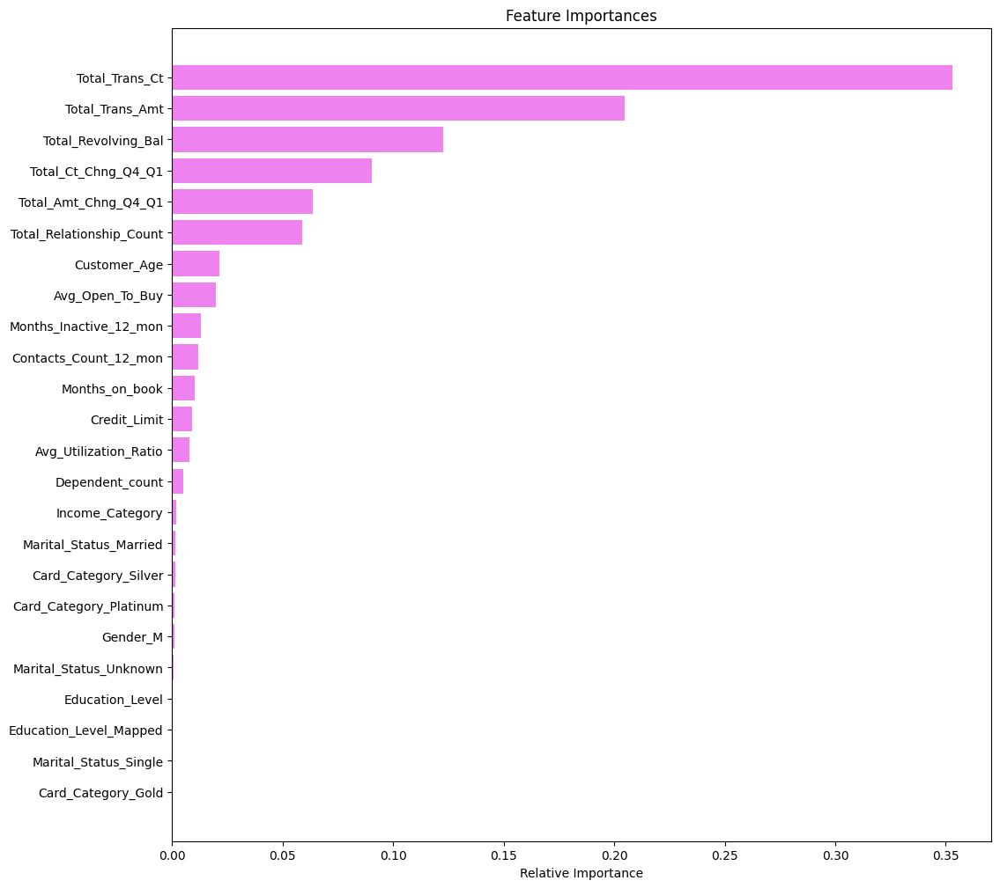

In [ ]:
feature_names = X_train.columns
importances = tuned_gbm1.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

# Business Insights and Conclusions

The total transaction count is the most significant variable in predicting customer attrition. To reduce the risk of churn, the bank should prioritize monitoring transaction volume closely. One strategy could involve offering incentives to existing customers if a decline in transaction activity is detected over time.

Additionally, the bank may want to focus on the spending behavior of customers, specifically the amounts they purchase. Understanding and addressing changes in purchasing patterns could provide valuable insights for improving customer retention.

***